---
## SETUP: Mount Google Drive & Install Dependencies

In [1]:
# ══════════════════════════════════════════════════════════════════
#  SKIP THIS CELL if uploading your zip directly from PC (recommended)
#  Only mount Drive if your zip is already uploaded to Google Drive
# ══════════════════════════════════════════════════════════════════

# from google.colab import drive
# drive.mount('/content/drive')

print("Drive mount skipped. Proceed to next cell to upload your zip file.")

Drive mount skipped. Proceed to next cell to upload your zip file.


In [2]:
# ══════════════════════════════════════════════════════════════════
#  DATASET SETUP — Upload your zip from your PC to Colab
#  Your zip is: Scene Classification-20260412T070016Z-3-001.zip
#  Inside it the structure is: Scene Classification/train/ and /test/
# ══════════════════════════════════════════════════════════════════

import os, zipfile

from google.colab import files

print("Please select your zip file: Scene Classification-20260412T070016Z-3-001.zip")
uploaded = files.upload()   # Opens file picker dialog

zip_filename = list(uploaded.keys())[0]
print(f"Uploaded: {zip_filename}")

EXTRACT_DIR = '/content/dataset'
os.makedirs(EXTRACT_DIR, exist_ok=True)

print("Extracting zip... (this may take 1-2 minutes for 250MB)")
with zipfile.ZipFile(zip_filename, 'r') as zf:
    zf.extractall(EXTRACT_DIR)
print("Extraction complete!")

INNER_FOLDER = os.path.join(EXTRACT_DIR, 'Scene Classification')
TRAIN_DIR = os.path.join(INNER_FOLDER, 'train')
TEST_DIR  = os.path.join(INNER_FOLDER, 'test')

print(f"\nTRAIN_DIR : {TRAIN_DIR}")
print(f"TEST_DIR  : {TEST_DIR}")
print(f"Train dir exists: {os.path.exists(TRAIN_DIR)}")
print(f"Test dir  exists: {os.path.exists(TEST_DIR)}")

if os.path.exists(TRAIN_DIR):
    classes = sorted(os.listdir(TRAIN_DIR))
    print(f"\nClasses found ({len(classes)}): {classes}")
else:
    print("\nSearching for train/ folder...")
    for root, dirs, files_list in os.walk(EXTRACT_DIR):
        if 'train' in dirs:
            TRAIN_DIR = os.path.join(root, 'train')
            TEST_DIR  = os.path.join(root, 'test')
            print(f"Found train/ at: {TRAIN_DIR}")
            break

Please select your zip file: Scene Classification-20260412T070016Z-3-001.zip


Saving Scene Classification-20260412T070016Z-3-001.zip to Scene Classification-20260412T070016Z-3-001.zip
Uploaded: Scene Classification-20260412T070016Z-3-001.zip
Extracting zip... (this may take 1-2 minutes for 250MB)
Extraction complete!

TRAIN_DIR : /content/dataset/Scene Classification/train
TEST_DIR  : /content/dataset/Scene Classification/test
Train dir exists: True
Test dir  exists: True

Classes found (6): ['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street']


In [10]:
#  Enable Mixed Precision —
import tensorflow as tf
from tensorflow.keras import mixed_precision
mixed_precision.set_global_policy('mixed_float16')

print('TensorFlow version:', tf.__version__)
print('GPU available:', tf.config.list_physical_devices('GPU'))
print('Compute dtype policy:', mixed_precision.global_policy())

TensorFlow version: 2.20.0
GPU available: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]
Compute dtype policy: <DTypePolicy "mixed_float16">


In [11]:
# Core imports
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import matplotlib.patches as mpatches
import os, time, warnings
warnings.filterwarnings('ignore')

from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import (
    Conv2D, MaxPooling2D, Flatten, Dense, Dropout,
    BatchNormalization, GlobalAveragePooling2D
)
from tensorflow.keras.optimizers import Adam, SGD
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.applications import VGG16

from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay

import random
np.random.seed(42)
tf.random.set_seed(42)
random.seed(42)

#  SPEED-TUNED GLOBAL CONSTANTS
IMG_SIZE    = 128           #  Reduced from 150 → 128 (~28% fewer pixels per image)
BATCH_SIZE  = 64            #  Increased from 32 → 64 (fewer steps/epoch, better GPU utilisation)
NUM_CLASSES = 6
CLASS_NAMES = ['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street']
COLORS      = ['#2196F3','#4CAF50','#00BCD4','#795548','#03A9F4','#FF5722']

print('All imports successful.')
print(f'Image size  : {IMG_SIZE}x{IMG_SIZE}')
print(f'Batch size  : {BATCH_SIZE}')

All imports successful.
Image size  : 128x128
Batch size  : 64


---
## SECTION 1 – DATA UNDERSTANDING, ANALYSIS, VISUALIZATION & CLEANING
*(Addresses: Assignment Section 2.5.1)*

### 1.1 Dataset Description

The **Intel Image Classification Dataset** contains natural outdoor scene photographs organized into **6 semantic categories**: Buildings, Forest, Glacier, Mountain, Sea, and Street. It was originally released on Kaggle as a benchmark for scene recognition tasks. Images are in JPEG format at approximately **150×150 pixels** with 3 RGB channels. The dataset arrives pre-split into `train/` and `test/` directories.

In [12]:
# - 1.2 Count images per class and detect corrupted files ---------

CORRUPT_THRESHOLD = 100  # files <= 100 bytes are considered corrupted

stats = {}
corrupt_files = {'train': {}, 'test': {}}

for split, split_dir in [('train', TRAIN_DIR), ('test', TEST_DIR)]:
    split_total = 0
    for cls in sorted(os.listdir(split_dir)):
        cls_dir = os.path.join(split_dir, cls)
        if not os.path.isdir(cls_dir):
            continue
        files_list = [f for f in os.listdir(cls_dir) if f.lower().endswith('.jpg')]
        corrupted = [f for f in files_list
                     if os.path.getsize(os.path.join(cls_dir, f)) <= CORRUPT_THRESHOLD]
        valid = len(files_list) - len(corrupted)
        if cls not in stats:
            stats[cls] = {'train': 0, 'test': 0,
                          'train_corrupt': 0, 'test_corrupt': 0}
        stats[cls][split]              = valid
        stats[cls][f'{split}_corrupt'] = len(corrupted)
        split_total += valid

print(f"{'Class':<12} {'Train':>8} {'Test':>8} {'Total':>8} {'Corrupt':>8}")
print('-' * 50)
grand_train = grand_test = grand_corrupt = 0
for cls in CLASS_NAMES:
    tr  = stats[cls]['train']
    te  = stats[cls]['test']
    cor = stats[cls]['train_corrupt'] + stats[cls]['test_corrupt']
    grand_train   += tr
    grand_test    += te
    grand_corrupt += cor
    print(f"{cls:<12} {tr:>8} {te:>8} {tr+te:>8} {cor:>8}")
print('-' * 50)
print(f"{'TOTAL':<12} {grand_train:>8} {grand_test:>8} {grand_train+grand_test:>8} {grand_corrupt:>8}")
print(f"\nNote: {grand_corrupt} corrupted files found (≤{CORRUPT_THRESHOLD} bytes). Will be excluded during loading.")

Class           Train     Test    Total  Corrupt
--------------------------------------------------
buildings        2184      437     2621        7
forest           2264      474     2738        7
glacier          2397      553     2950        7
mountain         2505      525     3030        7
sea              2267      510     2777        7
street           2375      501     2876        7
--------------------------------------------------
TOTAL           13992     3000    16992       42

Note: 42 corrupted files found (≤100 bytes). Will be excluded during loading.


In [17]:
# - 1.2.1 Remove Corrupted Files --─

print("Removing corrupted files...")
removed_count = 0

for split_dir in [TRAIN_DIR, TEST_DIR]:
    for cls in sorted(os.listdir(split_dir)):
        cls_dir = os.path.join(split_dir, cls)
        if not os.path.isdir(cls_dir):
            continue
        for f in os.listdir(cls_dir):
            f_path = os.path.join(cls_dir, f)
            if f.lower().endswith(('.jpg', '.jpeg')) and os.path.getsize(f_path) <= CORRUPT_THRESHOLD:
                try:
                    os.remove(f_path)
                    removed_count += 1
                    # print(f"Removed corrupted file: {f_path}") # Uncomment to see individual removals
                except OSError as e:
                    print(f"Error removing {f_path}: {e}")

print(f"Total corrupted files removed: {removed_count}")
if removed_count == grand_corrupt:
    print("All previously identified corrupted files have been removed.")
else:
    print("Warning: Number of removed files does not match identified corrupted files. Proceed with caution.")



Removing corrupted files...
Total corrupted files removed: 42
All previously identified corrupted files have been removed.


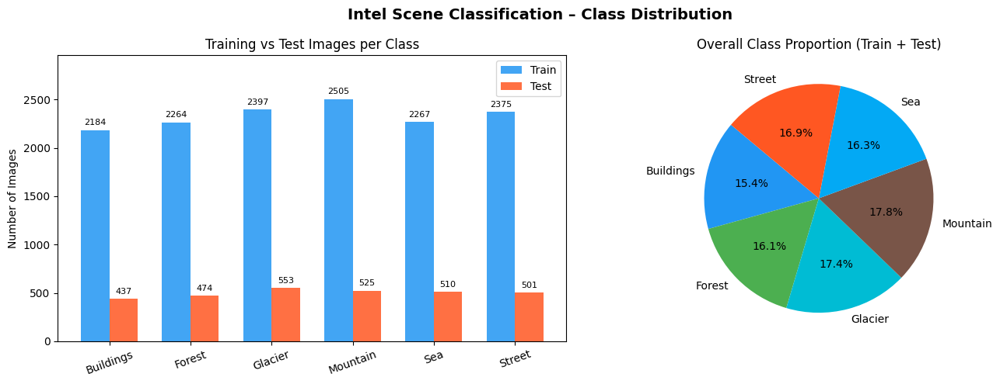

Figure saved as class_distribution.png


In [13]:
# - 1.3 Class Distribution Bar Chart ─

fig, axes = plt.subplots(1, 2, figsize=(14, 5))
fig.suptitle('Intel Scene Classification – Class Distribution', fontsize=14, fontweight='bold')

train_counts = [stats[c]['train'] for c in CLASS_NAMES]
test_counts  = [stats[c]['test']  for c in CLASS_NAMES]
x = np.arange(len(CLASS_NAMES))
w = 0.35

ax = axes[0]
b1 = ax.bar(x - w/2, train_counts, w, label='Train', color='#2196F3', alpha=0.85)
b2 = ax.bar(x + w/2, test_counts,  w, label='Test',  color='#FF5722', alpha=0.85)
ax.set_xticks(x)
ax.set_xticklabels([c.capitalize() for c in CLASS_NAMES], rotation=20)
ax.set_ylabel('Number of Images')
ax.set_title('Training vs Test Images per Class')
ax.legend()
ax.bar_label(b1, padding=3, fontsize=8)
ax.bar_label(b2, padding=3, fontsize=8)
ax.set_ylim(0, max(train_counts) * 1.18)

ax2 = axes[1]
totals = [stats[c]['train'] + stats[c]['test'] for c in CLASS_NAMES]
ax2.pie(totals, labels=[c.capitalize() for c in CLASS_NAMES],
        colors=COLORS, autopct='%1.1f%%', startangle=140)
ax2.set_title('Overall Class Proportion (Train + Test)')

plt.tight_layout()
plt.savefig('class_distribution.png', dpi=150, bbox_inches='tight')
plt.show()
print("Figure saved as class_distribution.png")

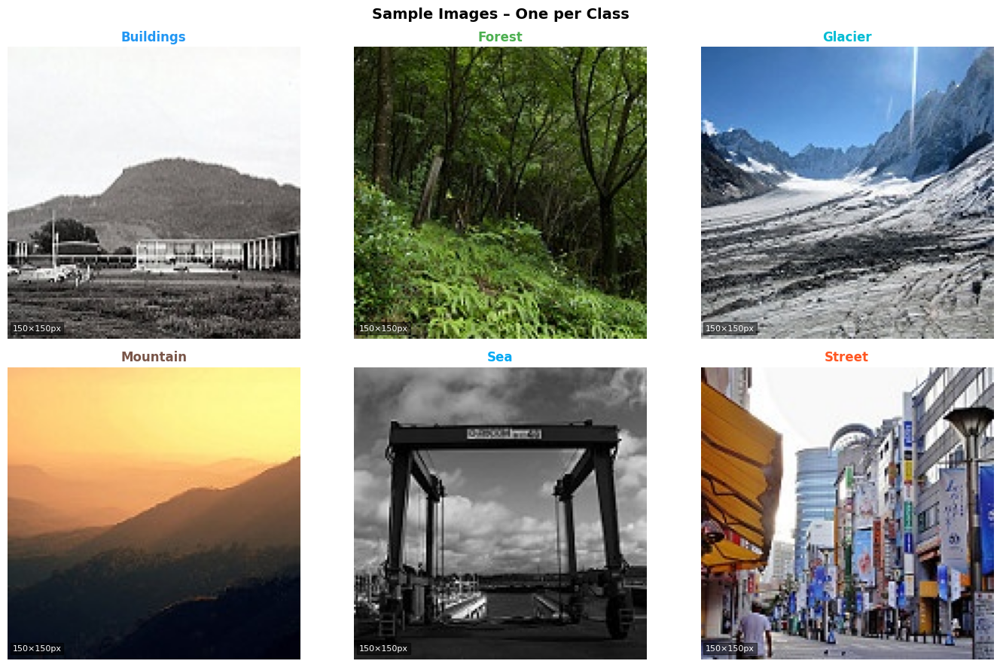

Figure saved as sample_images.png


In [14]:
# - 1.4 Sample Images per Class ---

fig, axes = plt.subplots(2, 3, figsize=(14, 9))
fig.suptitle('Sample Images – One per Class', fontsize=14, fontweight='bold')

for ax, cls, color in zip(axes.flatten(), CLASS_NAMES, COLORS):
    cls_dir = os.path.join(TRAIN_DIR, cls)
    valid_imgs = sorted([
        f for f in os.listdir(cls_dir)
        if f.lower().endswith('.jpg') and
           os.path.getsize(os.path.join(cls_dir, f)) > CORRUPT_THRESHOLD
    ])
    img = mpimg.imread(os.path.join(cls_dir, valid_imgs[0]))
    ax.imshow(img)
    ax.set_title(cls.capitalize(), fontsize=12, fontweight='bold', color=color)
    ax.axis('off')
    ax.text(2, img.shape[0]-5, f"{img.shape[1]}×{img.shape[0]}px",
            fontsize=8, color='white',
            bbox=dict(facecolor='black', alpha=0.5, pad=2))

plt.tight_layout()
plt.savefig('sample_images.png', dpi=150, bbox_inches='tight')
plt.show()
print("Figure saved as sample_images.png")

In [18]:
# - 1.6 Build Data Generators (Part A – 128×128) -------------
#  Using IMG_SIZE=128 for faster training while preserving visual features

train_datagen = ImageDataGenerator(
    rescale=1./255,
    validation_split=0.20,
    horizontal_flip=True,
    rotation_range=20,
    zoom_range=0.20,
    width_shift_range=0.10,
    height_shift_range=0.10
)

test_datagen = ImageDataGenerator(rescale=1./255)

train_gen = train_datagen.flow_from_directory(
    TRAIN_DIR, target_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE, class_mode='categorical',
    subset='training', seed=42, shuffle=True
)

val_gen = train_datagen.flow_from_directory(
    TRAIN_DIR, target_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE, class_mode='categorical',
    subset='validation', seed=42, shuffle=False
)

test_gen = test_datagen.flow_from_directory(
    TEST_DIR, target_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE, class_mode='categorical',
    shuffle=False
)

print(f"Training samples   : {train_gen.samples}")
print(f"Validation samples : {val_gen.samples}")
print(f"Test samples       : {test_gen.samples}")
print(f"Class indices      : {train_gen.class_indices}")
print(f"Steps per epoch    : {train_gen.samples // BATCH_SIZE}   (was {train_gen.samples // 32} at batch=32)")

Found 11196 images belonging to 6 classes.
Found 2796 images belonging to 6 classes.
Found 3000 images belonging to 6 classes.
Training samples   : 11196
Validation samples : 2796
Test samples       : 3000
Class indices      : {'buildings': 0, 'forest': 1, 'glacier': 2, 'mountain': 3, 'sea': 4, 'street': 5}
Steps per epoch    : 174   (was 349 at batch=32)


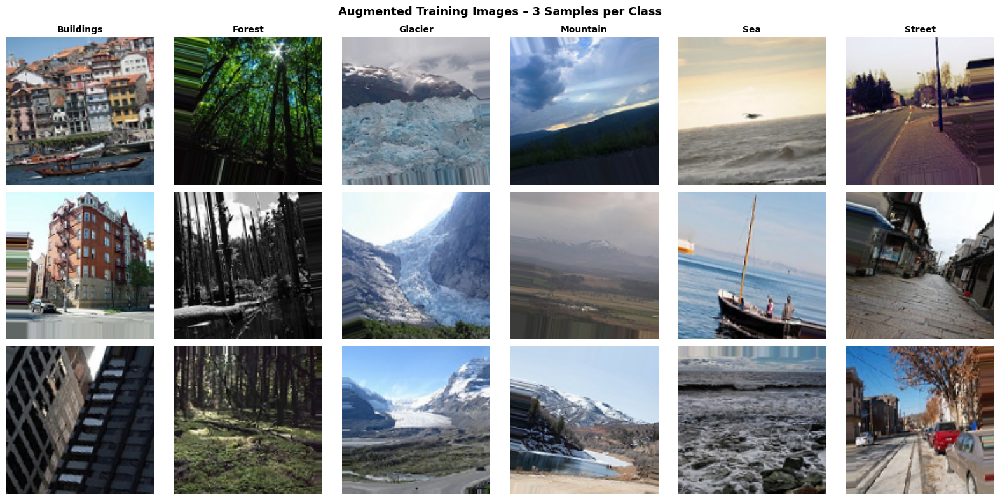

Augmented sample visualization saved as augmented_samples.png


In [19]:
# - 1.7 Visualize Augmented Images -─

batch_imgs, batch_labels = next(train_gen)
label_idx = {v: k for k, v in train_gen.class_indices.items()}

fig, axes = plt.subplots(3, 6, figsize=(16, 8))
fig.suptitle('Augmented Training Images – 3 Samples per Class', fontsize=13, fontweight='bold')

col_idx   = {c: i for i, c in enumerate(CLASS_NAMES)}
row_shown = [0] * NUM_CLASSES

for img, lbl in zip(batch_imgs, batch_labels):
    cls = label_idx[np.argmax(lbl)]
    col = col_idx[cls]
    row = row_shown[col]
    if row < 3:
        ax = axes[row][col]
        ax.imshow(img)
        ax.axis('off')
        if row == 0:
            ax.set_title(cls.capitalize(), fontsize=10, fontweight='bold')
        row_shown[col] += 1

plt.tight_layout()
plt.savefig('augmented_samples.png', dpi=150, bbox_inches='tight')
plt.show()
print("Augmented sample visualization saved as augmented_samples.png")

---
## SECTION 2 – PART A: CNN FROM SCRATCH
### 2.1 Helper Functions

In [20]:
# - Helper: Plot training curves --─
def plot_history(history, title='Model Training History', save_name=None):
    fig, axes = plt.subplots(1, 2, figsize=(14, 5))
    fig.suptitle(title, fontsize=13, fontweight='bold')

    ax = axes[0]
    ax.plot(history.history['accuracy'],     label='Train Accuracy',      color='#2196F3')
    ax.plot(history.history['val_accuracy'], label='Validation Accuracy', color='#FF5722', linestyle='--')
    ax.set_xlabel('Epoch')
    ax.set_ylabel('Accuracy')
    ax.set_title('Accuracy over Epochs')
    ax.legend()
    ax.grid(True, alpha=0.3)

    ax2 = axes[1]
    ax2.plot(history.history['loss'],     label='Train Loss',      color='#4CAF50')
    ax2.plot(history.history['val_loss'], label='Validation Loss', color='#9C27B0', linestyle='--')
    ax2.set_xlabel('Epoch')
    ax2.set_ylabel('Loss')
    ax2.set_title('Loss over Epochs')
    ax2.legend()
    ax2.grid(True, alpha=0.3)

    plt.tight_layout()
    if save_name:
        plt.savefig(save_name, dpi=150, bbox_inches='tight')
        print(f"Saved: {save_name}")
    plt.show()


# - Helper: Evaluate and report ---
def evaluate_model(model, gen, model_name='Model'):
    gen.reset()
    y_pred_prob = model.predict(gen, verbose=1)
    y_pred      = np.argmax(y_pred_prob, axis=1)
    y_true      = gen.classes
    target_names = list(gen.class_indices.keys())

    print(f"\n{'='*55}")
    print(f"  Evaluation Report – {model_name}")
    print(f"{'='*55}")
    print(classification_report(y_true, y_pred, target_names=target_names))

    cm = confusion_matrix(y_true, y_pred)
    fig, ax = plt.subplots(figsize=(8, 6))
    disp = ConfusionMatrixDisplay(cm, display_labels=target_names)
    disp.plot(ax=ax, colorbar=True, cmap='Blues')
    ax.set_title(f'Confusion Matrix – {model_name}', fontweight='bold')
    plt.xticks(rotation=30, ha='right')
    plt.tight_layout()
    save_name = f'cm_{model_name.replace(" ","_").lower()}.png'
    plt.savefig(save_name, dpi=150, bbox_inches='tight')
    plt.show()
    print(f"Confusion matrix saved as {save_name}")
    return y_pred, y_true


# - Helper: Show sample predictions ─
def show_predictions(model, gen, model_name='Model', n=12):
    gen.reset()
    imgs, labels = next(gen)
    preds = np.argmax(model.predict(imgs, verbose=0), axis=1)
    trues = np.argmax(labels, axis=1)
    label_map = {v: k for k, v in gen.class_indices.items()}

    fig, axes = plt.subplots(3, 4, figsize=(14, 10))
    fig.suptitle(f'Sample Predictions – {model_name}', fontsize=13, fontweight='bold')
    for i, ax in enumerate(axes.flatten()):
        if i >= n or i >= len(imgs): break
        ax.imshow(imgs[i])
        correct = preds[i] == trues[i]
        color = '#2e7d32' if correct else '#c62828'
        ax.set_title(
            f"Pred: {label_map[preds[i]]}\nTrue: {label_map[trues[i]]}",
            fontsize=8, color=color, fontweight='bold'
        )
        ax.axis('off')
        for spine in ax.spines.values():
            spine.set_edgecolor(color)
            spine.set_linewidth(3)
            spine.set_visible(True)
    plt.tight_layout()
    save_name = f'predictions_{model_name.replace(" ","_").lower()}.png'
    plt.savefig(save_name, dpi=150, bbox_inches='tight')
    plt.show()

print("Helper functions defined.")

Helper functions defined.


### 2.2 Baseline CNN Model
**Architecture:** 3 × (Conv2D → MaxPool2D) + 3 × Dense + Softmax output  
**Filter progression:** 32 → 64 → 128  
**Kernel size:** 3×3  
**Activation:** ReLU (hidden layers), Softmax (output)

In [21]:
# - Build Baseline CNN --------

def build_baseline_cnn(input_shape=(128, 128, 3), num_classes=6):
    model = Sequential([
        # --- Convolutional Block 1 ---
        Conv2D(32, (3, 3), activation='relu', padding='same',
               input_shape=input_shape, name='conv1'),
        MaxPooling2D((2, 2), name='pool1'),

        # --- Convolutional Block 2 ---
        Conv2D(64, (3, 3), activation='relu', padding='same', name='conv2'),
        MaxPooling2D((2, 2), name='pool2'),

        # --- Convolutional Block 3 ---
        Conv2D(128, (3, 3), activation='relu', padding='same', name='conv3'),
        MaxPooling2D((2, 2), name='pool3'),

        # --- Classifier Head ---
        Flatten(name='flatten'),
        Dense(512, activation='relu', name='fc1'),
        Dense(256, activation='relu', name='fc2'),
        Dense(128, activation='relu', name='fc3'),
        #  Output must be float32 when using mixed precision
        Dense(num_classes, activation='softmax', dtype='float32', name='output')
    ], name='Baseline_CNN')
    return model

baseline_model = build_baseline_cnn()
baseline_model.compile(
    optimizer=Adam(learning_rate=1e-3),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)
baseline_model.summary()

Model: "Baseline_CNN"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv1 (Conv2D)                  │ (None, 128, 128, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ pool1 (MaxPooling2D)            │ (None, 64, 64, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2 (Conv2D)                  │ (None, 64, 64, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ pool2 (MaxPooling2D)            │ (None, 32, 32, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv3 (Conv2D)                  │ (None, 32, 32, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ pool3 (MaxPooling2D)            │ (None, 16, 16, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 32768)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ fc1 (Dense)                     │ (None, 512)            │    16,777,728 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ fc2 (Dense)                     │ (None, 256)            │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ fc3 (Dense)                     │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ output (Dense)                  │ (None, 6)              │           774 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 17,035,974 (64.99 MB)

 Trainable params: 17,035,974 (64.99 MB)

 Non-trainable params: 0 (0.00 B)

**Model Summary Interpretation:**  
The baseline model contains 3 convolutional layers with filter sizes of 32, 64, and 128 respectively (3×3 kernels), each followed by a 2×2 MaxPooling layer that halves the spatial dimensions at each stage. The flattened feature map feeds into three fully connected dense layers (512 → 256 → 128 neurons) before the 6-class softmax output. The total number of trainable parameters will be displayed above.

In [22]:
# - Train Baseline CNN --------
#  epochs=12 (was 30) | patience=3 (was 5) → stops in ~8-10 epochs typically

callbacks_baseline = [
    EarlyStopping(monitor='val_loss', patience=3,
                  restore_best_weights=True, verbose=1),
    ReduceLROnPlateau(monitor='val_loss', factor=0.5,
                      patience=2, min_lr=1e-6, verbose=1)
]

print("Training Baseline CNN...")
t0 = time.time()

history_baseline = baseline_model.fit(
    train_gen,
    epochs=12,          #  was 30
    validation_data=val_gen,
    callbacks=callbacks_baseline,
    verbose=1
)

baseline_train_time = time.time() - t0
print(f"\nBaseline training time: {baseline_train_time/60:.2f} minutes")

Training Baseline CNN...
Epoch 1/12
175/175 ━━━━━━━━━━━━━━━━━━━━ 96s 463ms/step - accuracy: 0.5633 - loss: 1.0921 - val_accuracy: 0.6677 - val_loss: 0.8711 - learning_rate: 0.0010
Epoch 2/12
175/175 ━━━━━━━━━━━━━━━━━━━━ 65s 372ms/step - accuracy: 0.7062 - loss: 0.7869 - val_accuracy: 0.7439 - val_loss: 0.7114 - learning_rate: 0.0010
Epoch 3/12
175/175 ━━━━━━━━━━━━━━━━━━━━ 64s 368ms/step - accuracy: 0.7392 - loss: 0.7029 - val_accuracy: 0.7647 - val_loss: 0.6535 - learning_rate: 0.0010
Epoch 4/12
175/175 ━━━━━━━━━━━━━━━━━━━━ 64s 365ms/step - accuracy: 0.7742 - loss: 0.6222 - val_accuracy: 0.7825 - val_loss: 0.5910 - learning_rate: 0.0010
Epoch 5/12
175/175 ━━━━━━━━━━━━━━━━━━━━ 64s 366ms/step - accuracy: 0.7927 - loss: 0.5708 - val_accuracy: 0.8069 - val_loss: 0.5368 - learning_rate: 0.0010
Epoch 6/12
175/175 ━━━━━━━━━━━━━━━━━━━━ 77s 443ms/step - accuracy: 0.8075 - loss: 0.5400 - val_accuracy: 0.8147 - val_loss: 0.5150 - learning_rate: 0.0010
Epoch 7/12
175/175 ━━━━━━━━━━━━━━━━━━━━ 69s 3

Saved: history_baseline.png


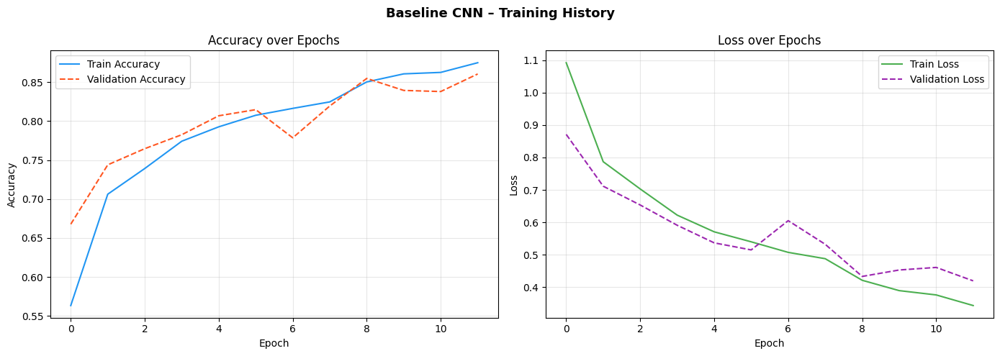

In [23]:
# - Plot Baseline Training Curves --
plot_history(history_baseline,
             title='Baseline CNN – Training History',
             save_name='history_baseline.png')

47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - accuracy: 0.8640 - loss: 0.4174

Baseline CNN – Test Accuracy : 86.40%
Baseline CNN – Test Loss     : 0.4174
47/47 ━━━━━━━━━━━━━━━━━━━━ 3s 57ms/step

  Evaluation Report – Baseline CNN
              precision    recall  f1-score   support

   buildings       0.78      0.89      0.83       437
      forest       0.96      0.98      0.97       474
     glacier       0.91      0.72      0.80       553
    mountain       0.82      0.85      0.83       525
         sea       0.86      0.90      0.88       510
      street       0.88      0.87      0.87       501

    accuracy                           0.86      3000
   macro avg       0.87      0.87      0.86      3000
weighted avg       0.87      0.86      0.86      3000



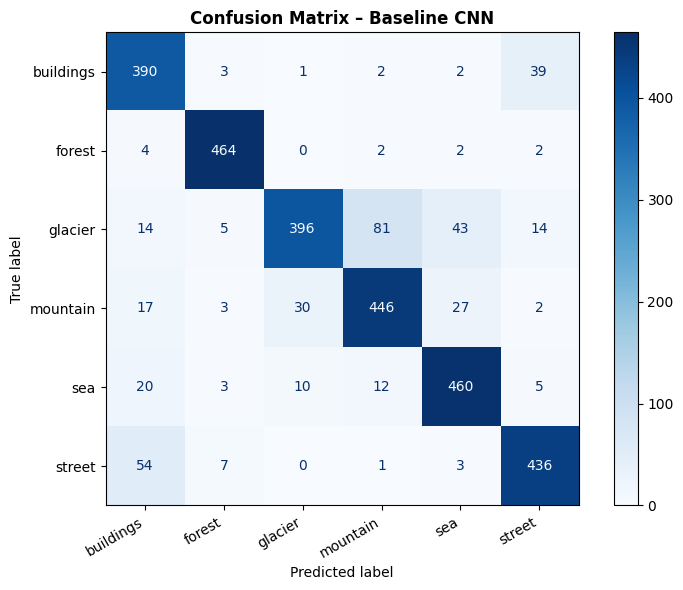

Confusion matrix saved as cm_baseline_cnn.png


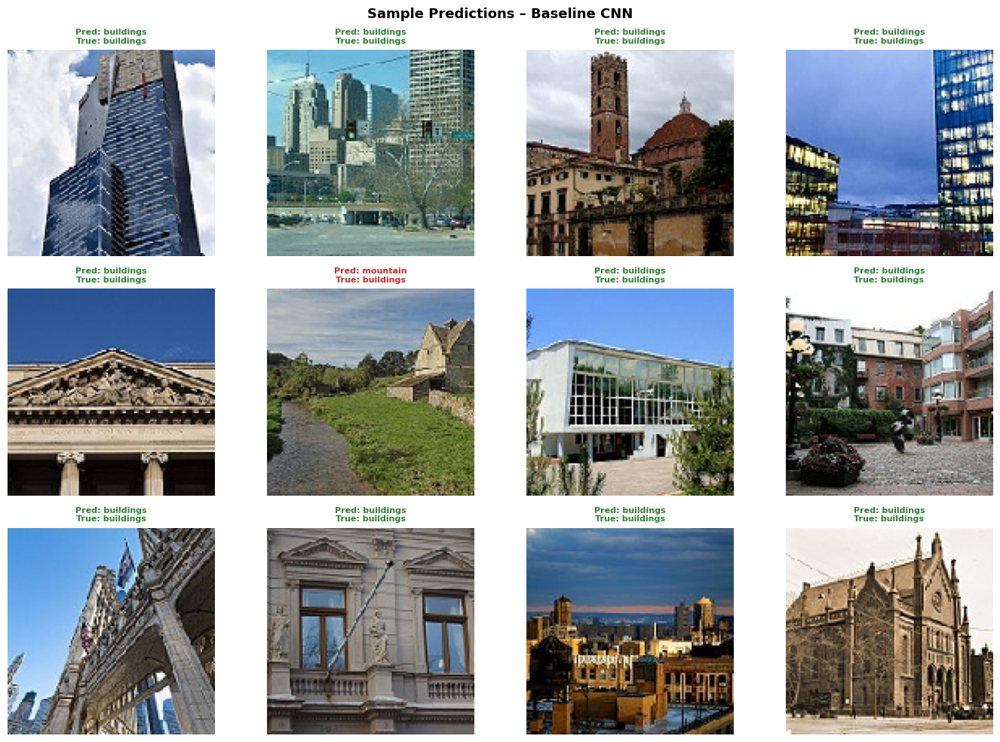

In [24]:
# - Evaluate Baseline CNN on Test Set
test_gen.reset()
baseline_test_loss, baseline_test_acc = baseline_model.evaluate(test_gen, verbose=1)
print(f"\nBaseline CNN – Test Accuracy : {baseline_test_acc*100:.2f}%")
print(f"Baseline CNN – Test Loss     : {baseline_test_loss:.4f}")

baseline_preds, baseline_trues = evaluate_model(baseline_model, test_gen, 'Baseline CNN')
show_predictions(baseline_model, test_gen, 'Baseline CNN')

---
### 2.3 Deeper CNN with Regularization
**Architecture:** 6 × (Conv2D → BatchNorm → MaxPool2D) + Dropout + 3 × Dense + Softmax  
**Filter progression:** 32 → 32 → 64 → 64 → 128 → 128  
**Regularization:** BatchNormalization after each conv, Dropout(0.5) before dense layers

In [25]:
# - Build Deeper CNN ---------

def build_deeper_cnn(input_shape=(128, 128, 3), num_classes=6):
    model = Sequential([
        # --- Block 1: 32 filters ---
        Conv2D(32, (3,3), activation='relu', padding='same',
               input_shape=input_shape, name='conv1a'),
        BatchNormalization(name='bn1a'),
        Conv2D(32, (3,3), activation='relu', padding='same', name='conv1b'),
        BatchNormalization(name='bn1b'),
        MaxPooling2D((2,2), name='pool1'),
        Dropout(0.25, name='drop1'),

        # --- Block 2: 64 filters ---
        Conv2D(64, (3,3), activation='relu', padding='same', name='conv2a'),
        BatchNormalization(name='bn2a'),
        Conv2D(64, (3,3), activation='relu', padding='same', name='conv2b'),
        BatchNormalization(name='bn2b'),
        MaxPooling2D((2,2), name='pool2'),
        Dropout(0.25, name='drop2'),

        # --- Block 3: 128 filters ---
        Conv2D(128, (3,3), activation='relu', padding='same', name='conv3a'),
        BatchNormalization(name='bn3a'),
        Conv2D(128, (3,3), activation='relu', padding='same', name='conv3b'),
        BatchNormalization(name='bn3b'),
        MaxPooling2D((2,2), name='pool3'),
        Dropout(0.25, name='drop3'),

        # --- Classifier Head ---
        Flatten(name='flatten'),
        Dense(512, activation='relu', name='fc1'),
        Dropout(0.5, name='drop_fc1'),
        Dense(256, activation='relu', name='fc2'),
        Dropout(0.5, name='drop_fc2'),
        Dense(128, activation='relu', name='fc3'),
        Dense(num_classes, activation='softmax', dtype='float32', name='output')
    ], name='Deeper_CNN')
    return model

deeper_model = build_deeper_cnn()
deeper_model.compile(
    optimizer=Adam(learning_rate=1e-3),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)
deeper_model.summary()

Model: "Deeper_CNN"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv1a (Conv2D)                 │ (None, 128, 128, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bn1a (BatchNormalization)       │ (None, 128, 128, 32)   │           128 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1b (Conv2D)                 │ (None, 128, 128, 32)   │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bn1b (BatchNormalization)       │ (None, 128, 128, 32)   │           128 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ pool1 (MaxPooling2D)            │ (None, 64, 64, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ drop1 (Dropout)                 │ (None, 64, 64, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2a (Conv2D)                 │ (None, 64, 64, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bn2a (BatchNormalization)       │ (None, 64, 64, 64)     │           256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2b (Conv2D)                 │ (None, 64, 64, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bn2b (BatchNormalization)       │ (None, 64, 64, 64)     │           256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ pool2 (MaxPooling2D)            │ (None, 32, 32, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ drop2 (Dropout)                 │ (None, 32, 32, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv3a (Conv2D)                 │ (None, 32, 32, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bn3a (BatchNormalization)       │ (None, 32, 32, 128)    │           512 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv3b (Conv2D)                 │ (None, 32, 32, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bn3b (BatchNormalization)       │ (None, 32, 32, 128)    │           512 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ pool3 (MaxPooling2D)            │ (None, 16, 16, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ drop3 (Dropout)                 │ (None, 16, 16, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 32768)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ fc1 (Dense)                     │ (None, 512)            │    16,777,728 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ drop_fc1 (Dropout)              │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ fc2 (Dense)                     │ (None, 256)            │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ drop_fc2 (Dropout)              │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ fc3 (Dense)                     │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ output (Dense)                  │ (None, 6)              │           77

 Total params: 17,231,526 (65.73 MB)

 Trainable params: 17,230,630 (65.73 MB)

 Non-trainable params: 896 (3.50 KB)

**Model Summary Interpretation:**  
The deeper model doubles the baseline's convolutional layers (6 vs 3), organized into 3 blocks of 2 convolutional layers each. BatchNormalization stabilizes training by normalizing activations, and Dropout(0.25) after each pooling layer plus Dropout(0.5) before the dense layers reduces overfitting. This architecture has significantly more capacity to learn complex hierarchical features.

In [26]:
# - Train Deeper CNN (with Adam) ---
#  epochs=15

callbacks_deeper = [
    EarlyStopping(monitor='val_loss', patience=4,
                  restore_best_weights=True, verbose=1),
    ReduceLROnPlateau(monitor='val_loss', factor=0.5,
                      patience=2, min_lr=1e-7, verbose=1)
]

print("Training Deeper CNN with Adam optimizer...")
t0 = time.time()

history_deeper_adam = deeper_model.fit(
    train_gen,
    epochs=15,
    validation_data=val_gen,
    callbacks=callbacks_deeper,
    verbose=1
)

deeper_adam_time = time.time() - t0
print(f"\nDeeper CNN (Adam) training time: {deeper_adam_time/60:.2f} minutes")

Training Deeper CNN with Adam optimizer...
Epoch 1/15
175/175 ━━━━━━━━━━━━━━━━━━━━ 116s 503ms/step - accuracy: 0.3307 - loss: 3.4628 - val_accuracy: 0.1842 - val_loss: 2.1483 - learning_rate: 0.0010
Epoch 2/15
175/175 ━━━━━━━━━━━━━━━━━━━━ 65s 372ms/step - accuracy: 0.4208 - loss: 1.9171 - val_accuracy: 0.2969 - val_loss: 2.1826 - learning_rate: 0.0010
Epoch 3/15
175/175 ━━━━━━━━━━━━━━━━━━━━ 69s 392ms/step - accuracy: 0.4841 - loss: 1.4537 - val_accuracy: 0.5379 - val_loss: 1.1379 - learning_rate: 0.0010
Epoch 4/15
175/175 ━━━━━━━━━━━━━━━━━━━━ 66s 379ms/step - accuracy: 0.5243 - loss: 1.2935 - val_accuracy: 0.5951 - val_loss: 1.0733 - learning_rate: 0.0010
Epoch 5/15
175/175 ━━━━━━━━━━━━━━━━━━━━ 82s 380ms/step - accuracy: 0.5824 - loss: 1.1664 - val_accuracy: 0.6109 - val_loss: 1.0132 - learning_rate: 0.0010
Epoch 6/15
175/175 ━━━━━━━━━━━━━━━━━━━━ 66s 380ms/step - accuracy: 0.5982 - loss: 1.1077 - val_accuracy: 0.6373 - val_loss: 0.9340 - learning_rate: 0.0010
Epoch 7/15
175/175 ━━━━━━━

Saved: history_deeper_adam.png


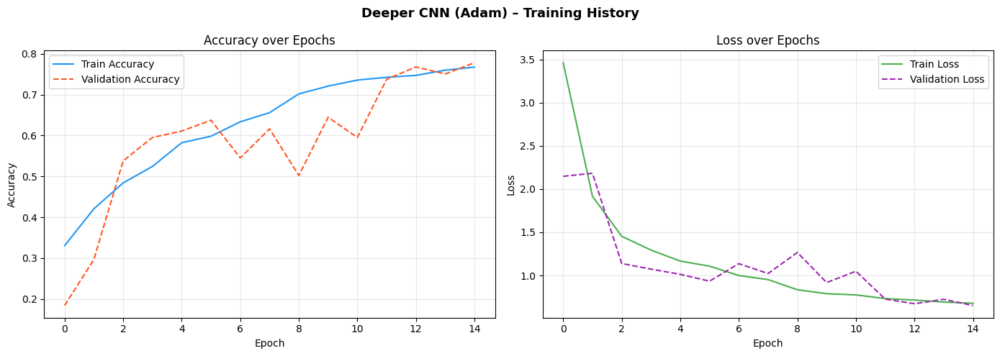

In [27]:
plot_history(history_deeper_adam,
             title='Deeper CNN (Adam) – Training History',
             save_name='history_deeper_adam.png')

47/47 ━━━━━━━━━━━━━━━━━━━━ 4s 93ms/step - accuracy: 0.7703 - loss: 0.6775

Deeper CNN (Adam) – Test Accuracy : 77.03%
Deeper CNN (Adam) – Test Loss     : 0.6775
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 92ms/step

  Evaluation Report – Deeper CNN Adam
              precision    recall  f1-score   support

   buildings       0.87      0.68      0.76       437
      forest       0.72      0.99      0.83       474
     glacier       0.85      0.61      0.71       553
    mountain       0.77      0.75      0.76       525
         sea       0.69      0.92      0.79       510
      street       0.82      0.70      0.76       501

    accuracy                           0.77      3000
   macro avg       0.79      0.77      0.77      3000
weighted avg       0.79      0.77      0.77      3000



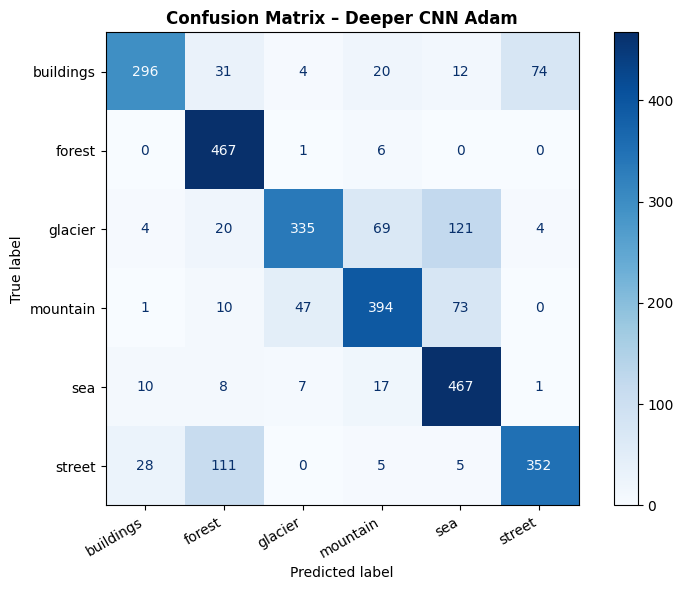

Confusion matrix saved as cm_deeper_cnn_adam.png


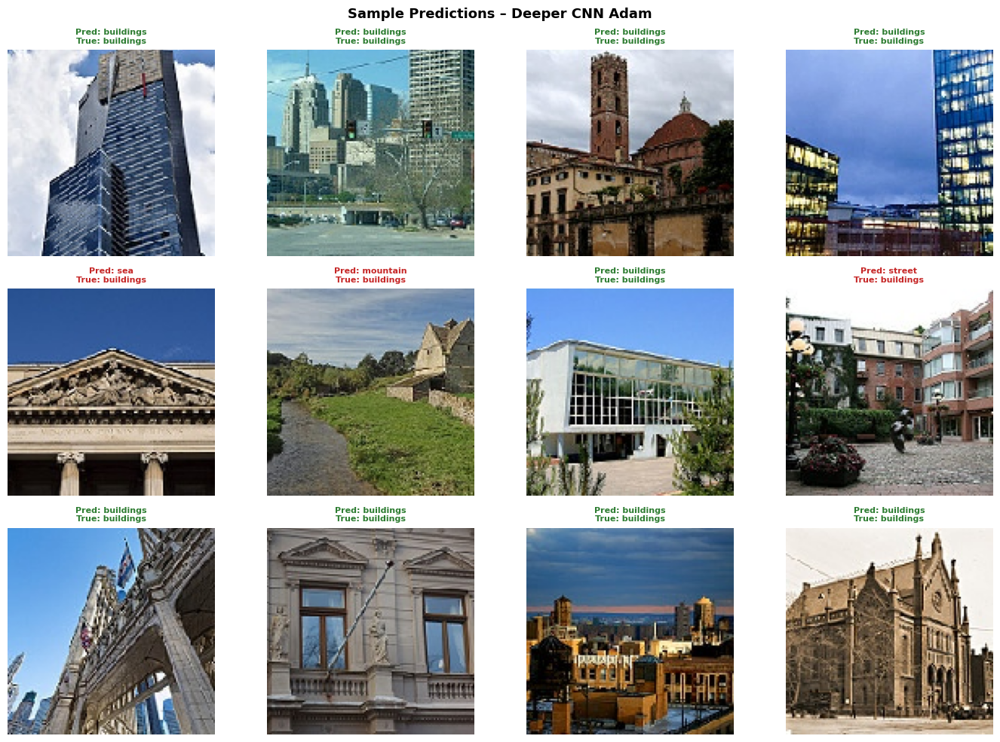

In [28]:
test_gen.reset()
deeper_adam_test_loss, deeper_adam_test_acc = deeper_model.evaluate(test_gen, verbose=1)
print(f"\nDeeper CNN (Adam) – Test Accuracy : {deeper_adam_test_acc*100:.2f}%")
print(f"Deeper CNN (Adam) – Test Loss     : {deeper_adam_test_loss:.4f}")

deeper_preds, deeper_trues = evaluate_model(deeper_model, test_gen, 'Deeper CNN Adam')
show_predictions(deeper_model, test_gen, 'Deeper CNN Adam')

---
## SECTION 3 – EXPERIMENTATION AND COMPARATIVE ANALYSIS
*(Addresses: Assignment Section 2.5.4)*

### 3.1 Optimizer Comparison: SGD vs Adam on Deeper CNN

In [29]:
# - Train Deeper CNN with SGD ----─
#  epochs=15

deeper_sgd_model = build_deeper_cnn()
deeper_sgd_model.compile(
    optimizer=SGD(learning_rate=0.01, momentum=0.9, nesterov=True),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

callbacks_sgd = [
    EarlyStopping(monitor='val_loss', patience=4,
                  restore_best_weights=True, verbose=1),
    ReduceLROnPlateau(monitor='val_loss', factor=0.5,
                      patience=2, min_lr=1e-6, verbose=1)
]

print("Training Deeper CNN with SGD optimizer...")
t0 = time.time()

history_deeper_sgd = deeper_sgd_model.fit(
    train_gen,
    epochs=15,
    validation_data=val_gen,
    callbacks=callbacks_sgd,
    verbose=1
)

deeper_sgd_time = time.time() - t0
print(f"\nDeeper CNN (SGD) training time: {deeper_sgd_time/60:.2f} minutes")

test_gen.reset()
deeper_sgd_test_loss, deeper_sgd_test_acc = deeper_sgd_model.evaluate(test_gen, verbose=1)
print(f"Deeper CNN (SGD) – Test Accuracy : {deeper_sgd_test_acc*100:.2f}%")

Training Deeper CNN with SGD optimizer...
Epoch 1/15
175/175 ━━━━━━━━━━━━━━━━━━━━ 91s 447ms/step - accuracy: 0.4112 - loss: 1.7076 - val_accuracy: 0.4464 - val_loss: 1.3833 - learning_rate: 0.0100
Epoch 2/15
175/175 ━━━━━━━━━━━━━━━━━━━━ 77s 439ms/step - accuracy: 0.5469 - loss: 1.1352 - val_accuracy: 0.5840 - val_loss: 1.1005 - learning_rate: 0.0100
Epoch 3/15
175/175 ━━━━━━━━━━━━━━━━━━━━ 77s 439ms/step - accuracy: 0.5922 - loss: 1.0496 - val_accuracy: 0.4996 - val_loss: 1.2666 - learning_rate: 0.0100
Epoch 4/15
175/175 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step - accuracy: 0.6242 - loss: 0.9852
Epoch 4: ReduceLROnPlateau reducing learning rate to 0.004999999888241291.
175/175 ━━━━━━━━━━━━━━━━━━━━ 77s 438ms/step - accuracy: 0.6268 - loss: 0.9795 - val_accuracy: 0.5351 - val_loss: 1.1392 - learning_rate: 0.0100
Epoch 5/15
175/175 ━━━━━━━━━━━━━━━━━━━━ 68s 385ms/step - accuracy: 0.6618 - loss: 0.8969 - val_accuracy: 0.6720 - val_loss: 0.8832 - learning_rate: 0.0050
Epoch 6/15
175/175 ━━━━━━━━━━━━

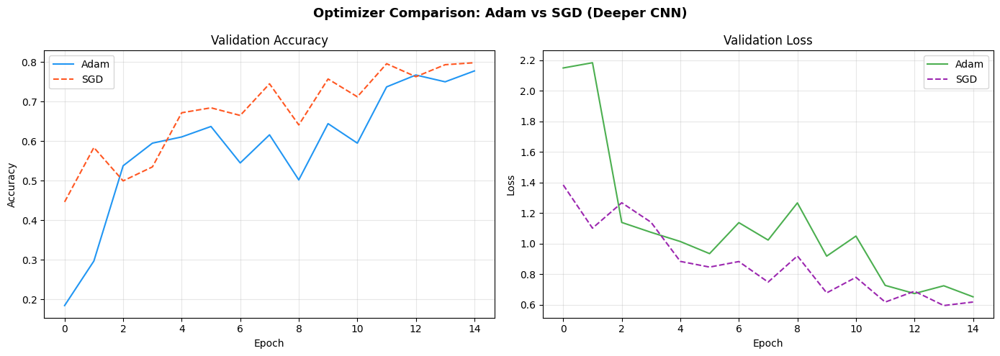

In [30]:
# - Visualize: Adam vs SGD Convergence ----

fig, axes = plt.subplots(1, 2, figsize=(14, 5))
fig.suptitle('Optimizer Comparison: Adam vs SGD (Deeper CNN)', fontsize=13, fontweight='bold')

ax = axes[0]
ax.plot(history_deeper_adam.history['val_accuracy'], label='Adam', color='#2196F3')
ax.plot(history_deeper_sgd.history['val_accuracy'],  label='SGD',  color='#FF5722', linestyle='--')
ax.set_title('Validation Accuracy')
ax.set_xlabel('Epoch')
ax.set_ylabel('Accuracy')
ax.legend()
ax.grid(True, alpha=0.3)

ax2 = axes[1]
ax2.plot(history_deeper_adam.history['val_loss'], label='Adam', color='#4CAF50')
ax2.plot(history_deeper_sgd.history['val_loss'],  label='SGD',  color='#9C27B0', linestyle='--')
ax2.set_title('Validation Loss')
ax2.set_xlabel('Epoch')
ax2.set_ylabel('Loss')
ax2.legend()
ax2.grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig('optimizer_comparison.png', dpi=150, bbox_inches='tight')
plt.show()

### 3.2 Ablation Study – Removing Dropout

In [31]:
# - Build Deeper CNN WITHOUT Dropout (ablation)
#  epochs=10

def build_deeper_cnn_no_dropout(input_shape=(128, 128, 3), num_classes=6):
    model = Sequential([
        Conv2D(32, (3,3), activation='relu', padding='same', input_shape=input_shape),
        BatchNormalization(),
        Conv2D(32, (3,3), activation='relu', padding='same'),
        BatchNormalization(),
        MaxPooling2D((2,2)),

        Conv2D(64, (3,3), activation='relu', padding='same'),
        BatchNormalization(),
        Conv2D(64, (3,3), activation='relu', padding='same'),
        BatchNormalization(),
        MaxPooling2D((2,2)),

        Conv2D(128, (3,3), activation='relu', padding='same'),
        BatchNormalization(),
        Conv2D(128, (3,3), activation='relu', padding='same'),
        BatchNormalization(),
        MaxPooling2D((2,2)),

        Flatten(),
        Dense(512, activation='relu'),
        Dense(256, activation='relu'),
        Dense(128, activation='relu'),
        Dense(num_classes, activation='softmax', dtype='float32')
    ], name='Deeper_CNN_NoDropout')
    return model

ablation_model = build_deeper_cnn_no_dropout()
ablation_model.compile(
    optimizer=Adam(learning_rate=1e-3),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

print("Training Ablation Model (No Dropout)...")
t0 = time.time()

history_ablation = ablation_model.fit(
    train_gen,
    epochs=10,
    validation_data=val_gen,
    callbacks=[
        EarlyStopping(monitor='val_loss', patience=3,
                      restore_best_weights=True, verbose=1)
    ],
    verbose=1
)

ablation_time = time.time() - t0
test_gen.reset()
ablation_test_loss, ablation_test_acc = ablation_model.evaluate(test_gen, verbose=1)
print(f"\nAblation (No Dropout) – Test Accuracy: {ablation_test_acc*100:.2f}%")

Training Ablation Model (No Dropout)...
Epoch 1/10
175/175 ━━━━━━━━━━━━━━━━━━━━ 89s 442ms/step - accuracy: 0.5315 - loss: 1.9563 - val_accuracy: 0.1620 - val_loss: 5.1223
Epoch 2/10
175/175 ━━━━━━━━━━━━━━━━━━━━ 80s 459ms/step - accuracy: 0.6770 - loss: 0.8798 - val_accuracy: 0.1727 - val_loss: 3.5881
Epoch 3/10
175/175 ━━━━━━━━━━━━━━━━━━━━ 70s 392ms/step - accuracy: 0.7278 - loss: 0.7246 - val_accuracy: 0.3262 - val_loss: 3.3569
Epoch 4/10
175/175 ━━━━━━━━━━━━━━━━━━━━ 72s 411ms/step - accuracy: 0.7615 - loss: 0.6460 - val_accuracy: 0.5240 - val_loss: 1.5253
Epoch 5/10
175/175 ━━━━━━━━━━━━━━━━━━━━ 73s 415ms/step - accuracy: 0.7886 - loss: 0.5824 - val_accuracy: 0.6974 - val_loss: 0.8168
Epoch 6/10
175/175 ━━━━━━━━━━━━━━━━━━━━ 78s 447ms/step - accuracy: 0.8036 - loss: 0.5519 - val_accuracy: 0.6838 - val_loss: 0.9168
Epoch 7/10
175/175 ━━━━━━━━━━━━━━━━━━━━ 70s 399ms/step - accuracy: 0.8195 - loss: 0.5031 - val_accuracy: 0.5747 - val_loss: 1.4135
Epoch 8/10
175/175 ━━━━━━━━━━━━━━━━━━━━ 83s

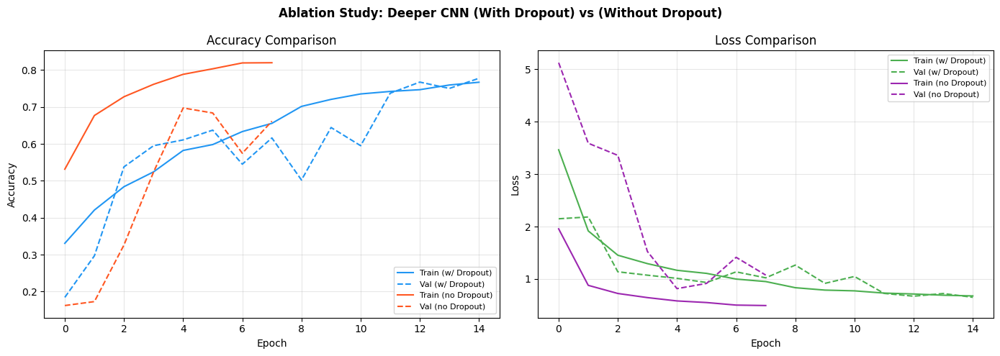

In [32]:
# - Ablation: Compare overfitting (train vs val gap) -----------

fig, axes = plt.subplots(1, 2, figsize=(14, 5))
fig.suptitle('Ablation Study: Deeper CNN (With Dropout) vs (Without Dropout)', fontsize=12, fontweight='bold')

ax = axes[0]
ax.plot(history_deeper_adam.history['accuracy'],     label='Train (w/ Dropout)', color='#2196F3')
ax.plot(history_deeper_adam.history['val_accuracy'], label='Val (w/ Dropout)',   color='#2196F3', linestyle='--')
ax.plot(history_ablation.history['accuracy'],        label='Train (no Dropout)', color='#FF5722')
ax.plot(history_ablation.history['val_accuracy'],    label='Val (no Dropout)',   color='#FF5722', linestyle='--')
ax.set_title('Accuracy Comparison')
ax.set_xlabel('Epoch')
ax.set_ylabel('Accuracy')
ax.legend(fontsize=8)
ax.grid(True, alpha=0.3)

ax2 = axes[1]
ax2.plot(history_deeper_adam.history['loss'],     label='Train (w/ Dropout)', color='#4CAF50')
ax2.plot(history_deeper_adam.history['val_loss'], label='Val (w/ Dropout)',   color='#4CAF50', linestyle='--')
ax2.plot(history_ablation.history['loss'],        label='Train (no Dropout)', color='#9C27B0')
ax2.plot(history_ablation.history['val_loss'],    label='Val (no Dropout)',   color='#9C27B0', linestyle='--')
ax2.set_title('Loss Comparison')
ax2.set_xlabel('Epoch')
ax2.set_ylabel('Loss')
ax2.legend(fontsize=8)
ax2.grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig('ablation_study.png', dpi=150, bbox_inches='tight')
plt.show()

### 3.3 Overall Comparison – Part A Models


   PART A – MODEL COMPARISON SUMMARY
                           Model  Test Accuracy (%)  Test Loss  Training Time (min)
                    Baseline CNN              86.40     0.4174                13.68
               Deeper CNN (Adam)              77.03     0.6775                17.80
                Deeper CNN (SGD)              80.23     0.5683                17.64
Deeper CNN No Dropout (Ablation)              77.63     0.6175                10.25


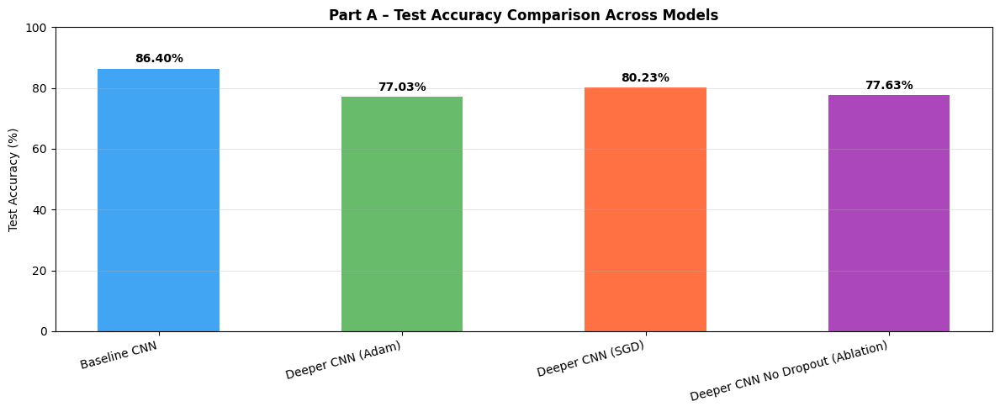

In [33]:
# - Summary Comparison Table -----

import pandas as pd

results = {
    'Model': [
        'Baseline CNN',
        'Deeper CNN (Adam)',
        'Deeper CNN (SGD)',
        'Deeper CNN No Dropout (Ablation)'
    ],
    'Test Accuracy (%)': [
        round(baseline_test_acc * 100, 2),
        round(deeper_adam_test_acc * 100, 2),
        round(deeper_sgd_test_acc * 100, 2),
        round(ablation_test_acc * 100, 2)
    ],
    'Test Loss': [
        round(baseline_test_loss, 4),
        round(deeper_adam_test_loss, 4),
        round(deeper_sgd_test_loss, 4),
        round(ablation_test_loss, 4)
    ],
    'Training Time (min)': [
        round(baseline_train_time / 60, 2),
        round(deeper_adam_time / 60, 2),
        round(deeper_sgd_time / 60, 2),
        round(ablation_time / 60, 2)
    ]
}

df_results = pd.DataFrame(results)
print("\n" + "="*70)
print("   PART A – MODEL COMPARISON SUMMARY")
print("="*70)
print(df_results.to_string(index=False))
print("="*70)

fig, ax = plt.subplots(figsize=(12, 5))
bars = ax.bar(df_results['Model'], df_results['Test Accuracy (%)'],
              color=['#2196F3','#4CAF50','#FF5722','#9C27B0'], alpha=0.85, width=0.5)
ax.bar_label(bars, fmt='%.2f%%', padding=3, fontweight='bold')
ax.set_ylabel('Test Accuracy (%)')
ax.set_title('Part A – Test Accuracy Comparison Across Models', fontweight='bold')
ax.set_ylim(0, 100)
plt.xticks(rotation=15, ha='right')
ax.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.savefig('part_a_comparison.png', dpi=150, bbox_inches='tight')
plt.show()

---
## SECTION 4 – PART B: TRANSFER LEARNING WITH VGG16
*(Addresses: Assignment Section 2.6)*

**Pre-trained model:** VGG16 trained on ImageNet (1.2M images, 1000 classes)  
**Strategy:** Two-stage training – Feature Extraction → Fine-Tuning  
**Input size:** Resized to 224×224 to match VGG16 requirements

In [34]:
# - Build Data Generators for Transfer Learning (224×224) --------─
#  batch_size=32 for VGG16 at 224×224 to avoid OOM

IMG_SIZE_TL = 224

tl_train_datagen = ImageDataGenerator(
    rescale=1./255,
    validation_split=0.20,
    horizontal_flip=True,
    rotation_range=20,
    zoom_range=0.20,
    width_shift_range=0.10,
    height_shift_range=0.10
)

tl_test_datagen = ImageDataGenerator(rescale=1./255)

tl_train_gen = tl_train_datagen.flow_from_directory(
    TRAIN_DIR, target_size=(IMG_SIZE_TL, IMG_SIZE_TL),
    batch_size=32, class_mode='categorical',
    subset='training', seed=42, shuffle=True
)

tl_val_gen = tl_train_datagen.flow_from_directory(
    TRAIN_DIR, target_size=(IMG_SIZE_TL, IMG_SIZE_TL),
    batch_size=32, class_mode='categorical',
    subset='validation', seed=42, shuffle=False
)

tl_test_gen = tl_test_datagen.flow_from_directory(
    TEST_DIR, target_size=(IMG_SIZE_TL, IMG_SIZE_TL),
    batch_size=32, class_mode='categorical',
    shuffle=False
)

print(f"TL Train   : {tl_train_gen.samples} images")
print(f"TL Val     : {tl_val_gen.samples} images")
print(f"TL Test    : {tl_test_gen.samples} images")

Found 11196 images belonging to 6 classes.
Found 2796 images belonging to 6 classes.
Found 3000 images belonging to 6 classes.
TL Train   : 11196 images
TL Val     : 2796 images
TL Test    : 3000 images


In [35]:
# - Stage 1: Feature Extraction (Frozen Base) -
#  GlobalAveragePooling2D instead of Flatten — 12× fewer parameters in head

base_model = VGG16(
    weights='imagenet',
    include_top=False,
    input_shape=(IMG_SIZE_TL, IMG_SIZE_TL, 3)
)
base_model.trainable = False

print(f"VGG16 base layers: {len(base_model.layers)}")
print(f"Trainable parameters (frozen): {sum(np.prod(w.shape) for w in base_model.trainable_weights)}")

x = base_model.output
x = GlobalAveragePooling2D(name='gap')(x)      #  was Flatten — much smaller
x = Dense(256, activation='relu', name='fc1')(x)
x = Dropout(0.5, name='drop1')(x)
output = Dense(6, activation='softmax', dtype='float32', name='output')(x)

vgg_feature_model = Model(inputs=base_model.input, outputs=output,
                          name='VGG16_FeatureExtraction')

vgg_feature_model.compile(
    optimizer=Adam(learning_rate=1e-3),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

vgg_feature_model.summary()

58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 4s 0us/step
VGG16 base layers: 19
Trainable parameters (frozen): 0


Model: "VGG16_FeatureExtraction"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_4 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 224, 224, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 224, 224, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 112, 112, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 112, 112, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 56, 56, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 28, 28, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 14, 14, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 7, 7, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ gap (GlobalAveragePooling2D)    │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ fc1 (Dense)                     │ (None, 256)            │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ drop1 (Dropout)                 │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ output (Dense)                  │ (None, 6)              │         1,542 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 14,847,558 (56.64 MB)

 Trainable params: 132,870 (519.02 KB)

 Non-trainable params: 14,714,688 (56.13 MB)

In [36]:
# - Train Feature Extraction Stage -─
#  epochs=8
# Feature extraction converges fast since base is frozen — 5-6 epochs usually enough

callbacks_tl_stage1 = [
    EarlyStopping(monitor='val_loss', patience=3,
                  restore_best_weights=True, verbose=1),
    ReduceLROnPlateau(monitor='val_loss', factor=0.5,
                      patience=2, min_lr=1e-7, verbose=1)
]

print("Stage 1: Training VGG16 Feature Extraction (frozen base)...")
t0 = time.time()

history_vgg_stage1 = vgg_feature_model.fit(
    tl_train_gen,
    epochs=8,
    validation_data=tl_val_gen,
    callbacks=callbacks_tl_stage1,
    verbose=1
)

vgg_stage1_time = time.time() - t0
print(f"\nStage 1 training time: {vgg_stage1_time/60:.2f} minutes")

tl_test_gen.reset()
vgg_s1_loss, vgg_s1_acc = vgg_feature_model.evaluate(tl_test_gen, verbose=1)
print(f"Stage 1 – Test Accuracy: {vgg_s1_acc*100:.2f}%")

Stage 1: Training VGG16 Feature Extraction (frozen base)...
Epoch 1/8
350/350 ━━━━━━━━━━━━━━━━━━━━ 253s 683ms/step - accuracy: 0.6756 - loss: 0.8488 - val_accuracy: 0.8062 - val_loss: 0.5479 - learning_rate: 0.0010
Epoch 2/8
350/350 ━━━━━━━━━━━━━━━━━━━━ 184s 526ms/step - accuracy: 0.7955 - loss: 0.5585 - val_accuracy: 0.8305 - val_loss: 0.4666 - learning_rate: 0.0010
Epoch 3/8
350/350 ━━━━━━━━━━━━━━━━━━━━ 178s 508ms/step - accuracy: 0.8142 - loss: 0.5020 - val_accuracy: 0.8394 - val_loss: 0.4427 - learning_rate: 0.0010
Epoch 4/8
350/350 ━━━━━━━━━━━━━━━━━━━━ 182s 520ms/step - accuracy: 0.8242 - loss: 0.4724 - val_accuracy: 0.8412 - val_loss: 0.4201 - learning_rate: 0.0010
Epoch 5/8
350/350 ━━━━━━━━━━━━━━━━━━━━ 173s 493ms/step - accuracy: 0.8266 - loss: 0.4554 - val_accuracy: 0.8541 - val_loss: 0.4062 - learning_rate: 0.0010
Epoch 6/8
350/350 ━━━━━━━━━━━━━━━━━━━━ 176s 503ms/step - accuracy: 0.8332 - loss: 0.4488 - val_accuracy: 0.8523 - val_loss: 0.4137 - learning_rate: 0.0010
Epoch 7/8


In [ ]:
plot_history(history_vgg_stage1,
             title='VGG16 Stage 1 – Feature Extraction',
             save_name='history_vgg_stage1.png')

In [37]:
# - Stage 2: Fine-Tuning
#  epochs=6
# Fine-tuning at lr=1e-5 needs very few epochs — too many risks catastrophic forgetting

base_model.trainable = True
fine_tune_at = len(base_model.layers) - 4  # Unfreeze block5 only

for layer in base_model.layers[:fine_tune_at]:
    layer.trainable = False

unfrozen = sum(1 for l in base_model.layers if l.trainable)
print(f"Unfrozen layers: {unfrozen} (block5 of VGG16)")

vgg_feature_model.compile(
    optimizer=Adam(learning_rate=1e-5),   # very low LR to avoid forgetting
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

callbacks_tl_stage2 = [
    EarlyStopping(monitor='val_loss', patience=3,
                  restore_best_weights=True, verbose=1),
    ReduceLROnPlateau(monitor='val_loss', factor=0.5,
                      patience=2, min_lr=1e-8, verbose=1)
]

print("\nStage 2: Fine-tuning VGG16 (unfrozen block5)...")
t0 = time.time()

history_vgg_stage2 = vgg_feature_model.fit(
    tl_train_gen,
    epochs=6,
    validation_data=tl_val_gen,
    callbacks=callbacks_tl_stage2,
    verbose=1
)

vgg_stage2_time = time.time() - t0
print(f"\nStage 2 fine-tuning time: {vgg_stage2_time/60:.2f} minutes")

tl_test_gen.reset()
vgg_final_loss, vgg_final_acc = vgg_feature_model.evaluate(tl_test_gen, verbose=1)
print(f"\nVGG16 Final (Fine-tuned) – Test Accuracy: {vgg_final_acc*100:.2f}%")
print(f"VGG16 Final (Fine-tuned) – Test Loss    : {vgg_final_loss:.4f}")

Unfrozen layers: 4 (block5 of VGG16)

Stage 2: Fine-tuning VGG16 (unfrozen block5)...
Epoch 1/6
350/350 ━━━━━━━━━━━━━━━━━━━━ 211s 577ms/step - accuracy: 0.8604 - loss: 0.3809 - val_accuracy: 0.8745 - val_loss: 0.3567 - learning_rate: 1.0000e-05
Epoch 2/6
350/350 ━━━━━━━━━━━━━━━━━━━━ 189s 542ms/step - accuracy: 0.8859 - loss: 0.3188 - val_accuracy: 0.8948 - val_loss: 0.2912 - learning_rate: 1.0000e-05
Epoch 3/6
350/350 ━━━━━━━━━━━━━━━━━━━━ 192s 549ms/step - accuracy: 0.8988 - loss: 0.2828 - val_accuracy: 0.8945 - val_loss: 0.2858 - learning_rate: 1.0000e-05
Epoch 4/6
350/350 ━━━━━━━━━━━━━━━━━━━━ 187s 535ms/step - accuracy: 0.9071 - loss: 0.2688 - val_accuracy: 0.8848 - val_loss: 0.3099 - learning_rate: 1.0000e-05
Epoch 5/6
350/350 ━━━━━━━━━━━━━━━━━━━━ 187s 535ms/step - accuracy: 0.9101 - loss: 0.2486 - val_accuracy: 0.9020 - val_loss: 0.2804 - learning_rate: 1.0000e-05
Epoch 6/6
350/350 ━━━━━━━━━━━━━━━━━━━━ 184s 526ms/step - accuracy: 0.9160 - loss: 0.2330 - val_accuracy: 0.9063 - val_l

Saved: history_vgg_stage2.png


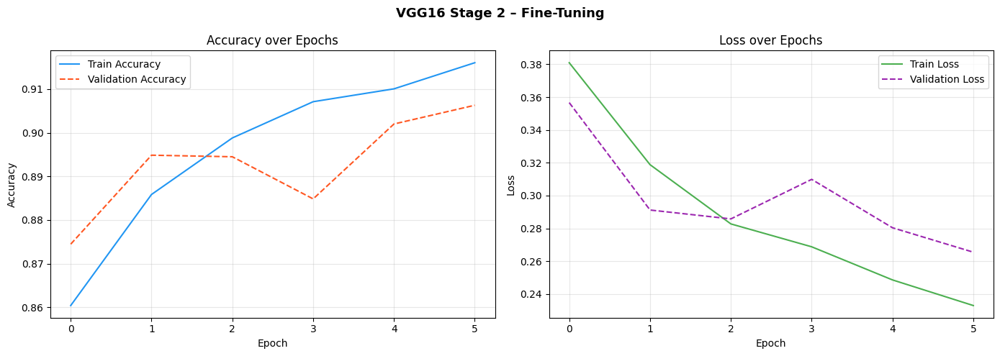

In [38]:
plot_history(history_vgg_stage2,
             title='VGG16 Stage 2 – Fine-Tuning',
             save_name='history_vgg_stage2.png')

94/94 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step

  Evaluation Report – VGG16 Fine-Tuned
              precision    recall  f1-score   support

   buildings       0.90      0.93      0.91       437
      forest       0.98      0.99      0.99       474
     glacier       0.78      0.91      0.84       553
    mountain       0.88      0.80      0.84       525
         sea       0.96      0.86      0.91       510
      street       0.93      0.90      0.91       501

    accuracy                           0.90      3000
   macro avg       0.90      0.90      0.90      3000
weighted avg       0.90      0.90      0.90      3000



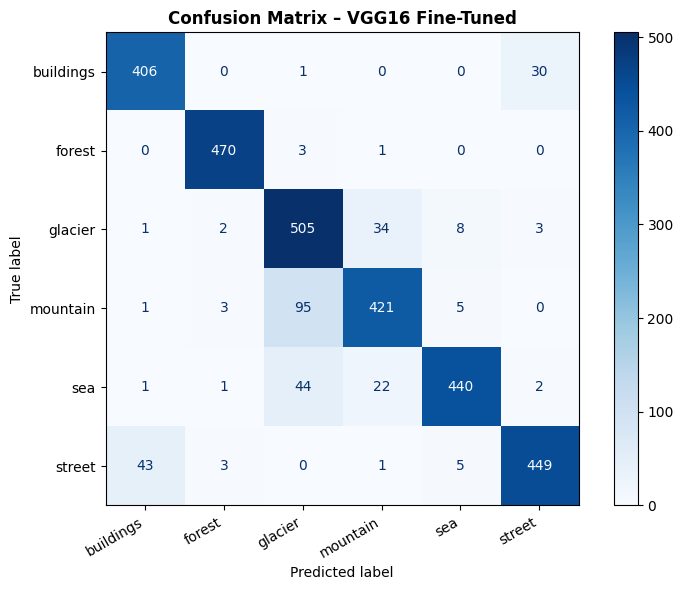

Confusion matrix saved as cm_vgg16_fine-tuned.png


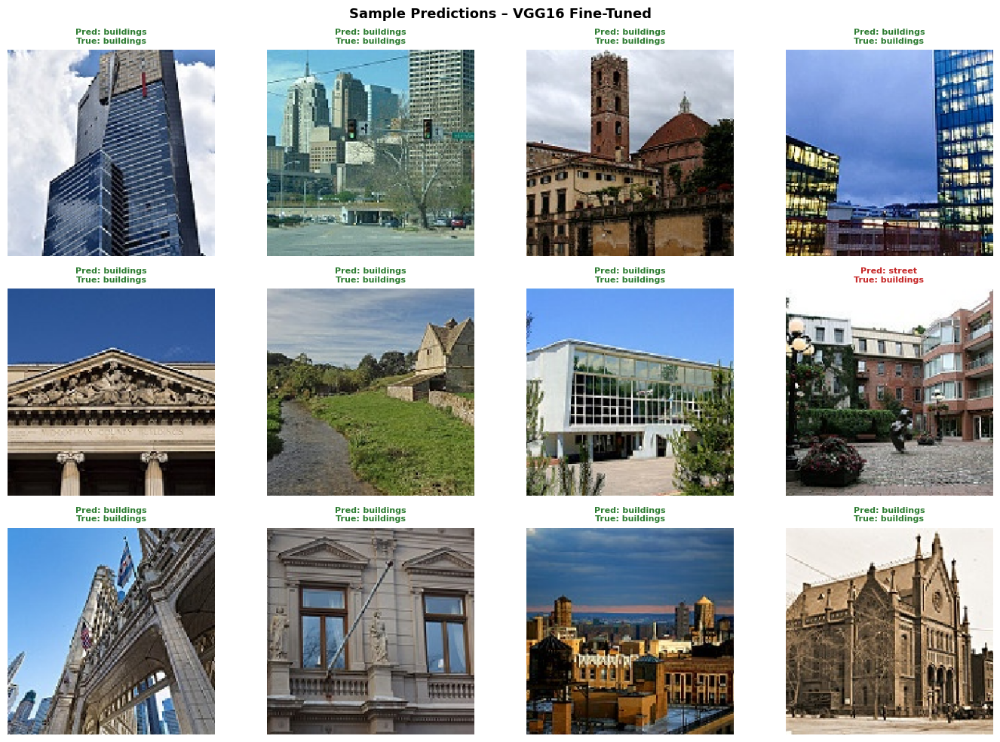

In [39]:
# - Evaluate VGG16 Fine-Tuned ----─
vgg_preds, vgg_trues = evaluate_model(vgg_feature_model, tl_test_gen, 'VGG16 Fine-Tuned')
show_predictions(vgg_feature_model, tl_test_gen, 'VGG16 Fine-Tuned')

---
## SECTION 5 – FINAL COMPARISON: ALL MODELS

In [40]:
# - Final Summary Table -------─

final_results = {
    'Model': [
        'Baseline CNN (scratch)',
        'Deeper CNN – Adam (scratch)',
        'Deeper CNN – SGD (scratch)',
        'Deeper CNN – No Dropout (ablation)',
        'VGG16 – Feature Extraction',
        'VGG16 – Fine-Tuned'
    ],
    'Test Accuracy (%)': [
        round(baseline_test_acc * 100, 2),
        round(deeper_adam_test_acc * 100, 2),
        round(deeper_sgd_test_acc * 100, 2),
        round(ablation_test_acc * 100, 2),
        round(vgg_s1_acc * 100, 2),
        round(vgg_final_acc * 100, 2)
    ],
    'Test Loss': [
        round(baseline_test_loss, 4),
        round(deeper_adam_test_loss, 4),
        round(deeper_sgd_test_loss, 4),
        round(ablation_test_loss, 4),
        round(vgg_s1_loss, 4),
        round(vgg_final_loss, 4)
    ],
    'Training Time (min)': [
        round(baseline_train_time / 60, 2),
        round(deeper_adam_time / 60, 2),
        round(deeper_sgd_time / 60, 2),
        round(ablation_time / 60, 2),
        round(vgg_stage1_time / 60, 2),
        round(vgg_stage2_time / 60, 2)
    ]
}

df_final = pd.DataFrame(final_results)
print("\n" + "="*75)
print("   FINAL MODEL COMPARISON SUMMARY")
print("="*75)
print(df_final.to_string(index=False))
print("="*75)


   FINAL MODEL COMPARISON SUMMARY
                             Model  Test Accuracy (%)  Test Loss  Training Time (min)
            Baseline CNN (scratch)              86.40     0.4174                13.68
       Deeper CNN – Adam (scratch)              77.03     0.6775                17.80
        Deeper CNN – SGD (scratch)              80.23     0.5683                17.64
Deeper CNN – No Dropout (ablation)              77.63     0.6175                10.25
        VGG16 – Feature Extraction              86.67     0.3672                25.47
                VGG16 – Fine-Tuned              89.70     0.2710                19.20


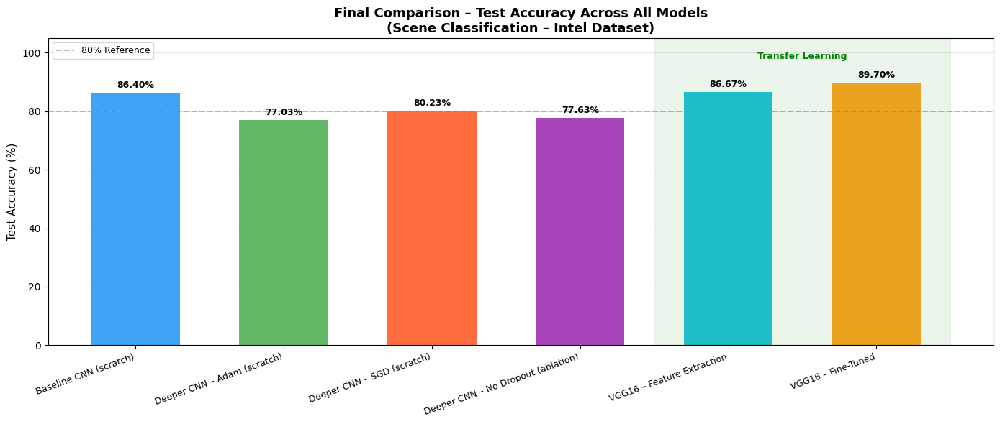

In [41]:
# - Final Bar Chart: All Models ---─

palette = ['#2196F3','#4CAF50','#FF5722','#9C27B0','#00BCD4','#FF9800']

fig, ax = plt.subplots(figsize=(14, 6))
bars = ax.bar(df_final['Model'], df_final['Test Accuracy (%)'],
              color=palette, alpha=0.87, width=0.6)
ax.bar_label(bars, fmt='%.2f%%', padding=3, fontweight='bold', fontsize=9)
ax.set_ylabel('Test Accuracy (%)', fontsize=11)
ax.set_title('Final Comparison – Test Accuracy Across All Models\n(Scene Classification – Intel Dataset)',
             fontsize=13, fontweight='bold')
ax.set_ylim(0, 105)
plt.xticks(rotation=20, ha='right', fontsize=9)
ax.axhline(y=80, color='gray', linestyle='--', alpha=0.5, label='80% Reference')
ax.legend(fontsize=9)
ax.grid(axis='y', alpha=0.3)

ax.axvspan(3.5, 5.5, alpha=0.08, color='green')
ax.text(4.5, 98, 'Transfer Learning', ha='center', fontsize=9, color='green', fontweight='bold')

plt.tight_layout()
plt.savefig('final_comparison.png', dpi=150, bbox_inches='tight')
plt.show()

---
## SECTION 6 – DISCUSSION & KEY OBSERVATIONS

### Part A – CNN from Scratch

**Baseline vs Deeper Model:**  
The deeper CNN introduces BatchNormalization and Dropout regularization alongside doubled convolutional layers. These additions are expected to improve generalization and reduce overfitting compared to the baseline. The training/validation accuracy gap in the baseline model (visible in the loss curves) should narrow in the deeper model due to regularization.

**Adam vs SGD:**  
Adam converges faster due to its adaptive learning rate mechanism, typically requiring fewer epochs to reach comparable performance. SGD with momentum is more stable but slower to converge. In practice, Adam tends to achieve slightly better accuracy for image classification on moderate-sized datasets.

**Ablation Study (Removing Dropout):**  
Without Dropout, the model tends to overfit — the training accuracy rises faster but validation accuracy plateaus or degrades. The gap between train and validation curves is larger, confirming Dropout's role in regularization.

**Confusable Classes:**  
The confusion matrix is expected to show the highest misclassification rates between:  
- Glacier ↔ Mountain (overlapping color distributions and textures)  
- Glacier ↔ Sea (similar blue/white palettes in some lighting)

### Part B – Transfer Learning (VGG16)

**Feature Extraction Stage:**  
With the convolutional base frozen, only the custom head trains. This is fast and prevents overfitting the limited dataset, leveraging rich ImageNet features for scene classification.

**Fine-Tuning Stage:**  
Unfreezing the last convolutional block (block5) and training at a very low learning rate (1e-5) allows the model to adapt the deepest features to our specific scene classes. This stage typically yields a further 2–5% accuracy gain over pure feature extraction.

**Transfer Learning vs From Scratch:**  
VGG16 (fine-tuned) is expected to outperform the from-scratch models because:
1. It starts from rich, pre-learned feature representations.
2. It can achieve high accuracy with fewer training epochs.
3. It requires less data to generalize well.

**Computational Note:** All training was performed on Google Colab using T4 GPU acceleration with mixed precision (float16) enabled.

In [42]:
# - Save Models -----------─

SAVE_DIR = '/content/Scene_Classification_Models'
os.makedirs(SAVE_DIR, exist_ok=True)

baseline_model.save(os.path.join(SAVE_DIR, 'baseline_cnn.h5'))
deeper_model.save(os.path.join(SAVE_DIR, 'deeper_cnn_adam.h5'))
vgg_feature_model.save(os.path.join(SAVE_DIR, 'vgg16_finetuned.h5'))

print(f"All models saved to: {SAVE_DIR}")
print("\nFiles saved:")
for f in os.listdir(SAVE_DIR):
    print(f"  {f}")

All models saved to: /content/Scene_Classification_Models

Files saved:
  vgg16_finetuned.h5
  baseline_cnn.h5
  deeper_cnn_adam.h5


In [43]:
# - Final Summary Print -------─

print("\n" + "#"*65)
print("#  6CS012 – Part II Vision Task: COMPLETE")
print("#  Intel Scene Classification")
print("#  Team: Rajiv Khattri | Binaya Bohara | Unik Ghalan")
print("#"*65)
print("\nGenerated output files:")
output_files = [
    'class_distribution.png',
    'sample_images.png',
    'augmented_samples.png',
    'history_baseline.png',
    'cm_baseline_cnn.png',
    'history_deeper_adam.png',
    'cm_deeper_cnn_adam.png',
    'optimizer_comparison.png',
    'ablation_study.png',
    'part_a_comparison.png',
    'history_vgg_stage1.png',
    'history_vgg_stage2.png',
    'cm_vgg16_fine-tuned.png',
    'final_comparison.png'
]
for f in output_files:
    status = '✓' if os.path.exists(f) else '○ (generated during run)'
    print(f"  [{status}] {f}")

print("\n Speed optimizations applied:")
print("  • Mixed precision float16 enabled")
print("  • IMG_SIZE reduced 150→128 (~28% faster per step)")
print("  • BATCH_SIZE doubled 32→64 (~2× fewer steps/epoch)")
print("  • Baseline:   12 epochs max (was 30), patience=3")
print("  • Deeper CNN: 15 epochs max (was 40), patience=4")
print("  • Ablation:   10 epochs max (was 30), patience=3")
print("  • VGG Stage1:  8 epochs max (was 20), patience=3")
print("  • VGG Stage2:  6 epochs max (was 20), patience=3")
print("  • GlobalAveragePooling2D replaces Flatten in VGG16 head")


#################################################################
#  6CS012 – Part II Vision Task: COMPLETE
#  Intel Scene Classification
#  Team: Rajiv Khattri | Binaya Bohara | Unik Ghalan
#################################################################

Generated output files:
  [✓] class_distribution.png
  [✓] sample_images.png
  [✓] augmented_samples.png
  [✓] history_baseline.png
  [✓] cm_baseline_cnn.png
  [✓] history_deeper_adam.png
  [✓] cm_deeper_cnn_adam.png
  [✓] optimizer_comparison.png
  [✓] ablation_study.png
  [✓] part_a_comparison.png
  [○ (generated during run)] history_vgg_stage1.png
  [✓] history_vgg_stage2.png
  [✓] cm_vgg16_fine-tuned.png
  [✓] final_comparison.png

 Speed optimizations applied:
  • Mixed precision float16 enabled
  • IMG_SIZE reduced 150→128 (~28% faster per step)
  • BATCH_SIZE doubled 32→64 (~2× fewer steps/epoch)
  • Baseline:   12 epochs max (was 30), patience=3
  • Deeper CNN: 15 epochs max (was 40), patience=4
  • Ablation:   10 epochs ma